In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import mrcfile
import torch

from tomoSegmentPipeline.utils.common import read_array, write_array
from tomoSegmentPipeline.utils import setup
from cryoS2Sdrop.dataloader import singleCET_dataset, singleCET_FourierDataset

import tomopy.sim.project as proj
from tomopy.recon.algorithm import recon
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

PARENT_PATH = setup.PARENT_PATH

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 80

def standardize(X):
    mean = X.mean()
    std = X.std()
    new_X = (X - mean) / std

    return new_X

def clip(X, low=0.005, high=0.995):
    # works with tensors =)
    return np.clip(X, np.quantile(X, low), np.quantile(X, high))

/home/ubuntu/Thesis/miniconda3/envs/jero/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [271]:
# cet_path = os.path.join(PARENT_PATH, 'data/S2SDenoising/dummy_tomograms/tomo02_dummy.mrc')
# gt_tomo_path = os.path.join(PARENT_PATH, "data/S2SDenoising/dummy_tomograms/tomo02_cryoCAREDummy.mrc")

model_number = 14
cet_path = os.path.join(PARENT_PATH,
                        '/home/ubuntu/Thesis/data/S2SDenoising/dummy_tomograms/tomoPhantom_model%i_noisyGaussPoissM_Perlin.mrc' %model_number)
gt_tomo_path = os.path.join(PARENT_PATH,
                        '/home/ubuntu/Thesis/data/S2SDenoising/dummy_tomograms/tomoPhantom_model%i.mrc' %model_number)

# cet_path = os.path.join(PARENT_PATH,
#                         'data/shrec2021/model_8/reconstruction.mrc')
# gt_tomo_path = os.path.join(PARENT_PATH,
#                         'data/shrec2021/model_8/grandmodel.mrc')



my_dataset = singleCET_FourierDataset(cet_path, 96, 0.3, gt_tomo_path=gt_tomo_path, n_bernoulli_samples=2)
tomo_data = my_dataset.data
tomo_shape = np.array(tomo_data.shape)
tomo_shape

Creating Fourier samples...
Done!


array([161, 256, 256])

In [272]:
my_dataset.fourier_samples.shape

torch.Size([105, 1, 161, 256, 256])

In [273]:
my_dataset.dataF.shape

torch.Size([161, 256, 129])

In [274]:
# fft_data = my_dataset.dataF.numpy()
fft_data = np.fft.fftshift(np.fft.fftn(tomo_data))
# fft_data = fft_data[:, :, 0:233]
logPower_Fdata = np.log(np.abs(fft_data)**2)
logPower_Fdata = standardize(clip(logPower_Fdata))

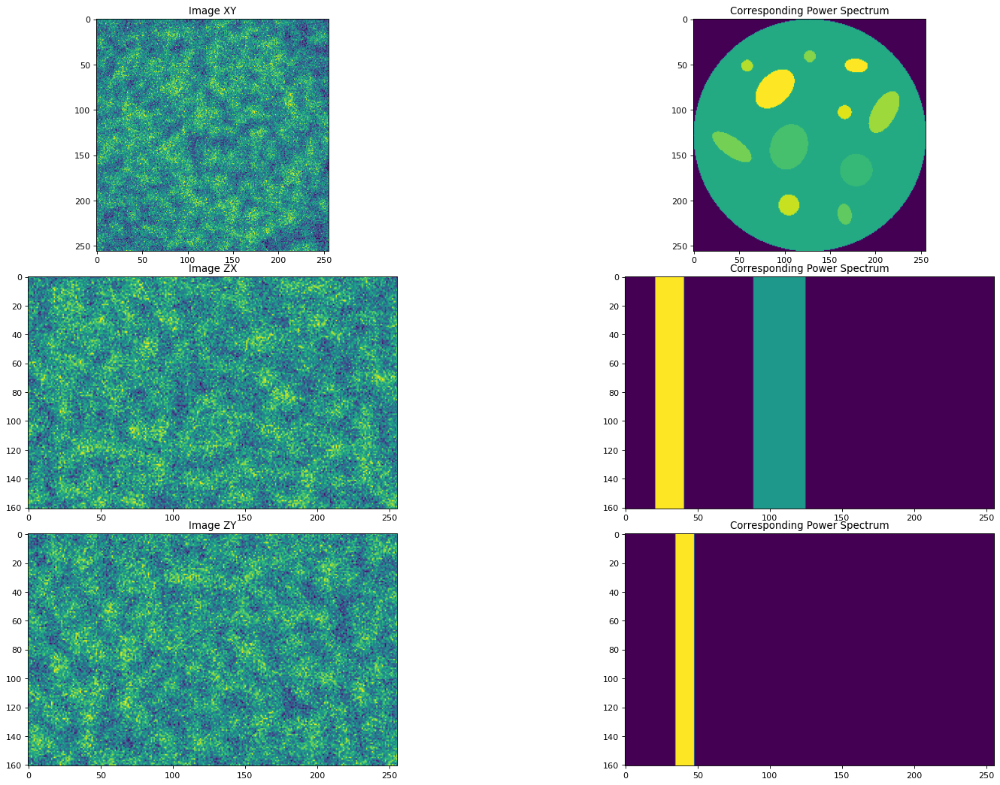

In [275]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [1, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_data[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(my_dataset.gt_data[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_data[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(my_dataset.gt_data[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_data[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(my_dataset.gt_data[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

In [276]:
logPower_Fdata.shape

(161, 256, 256)

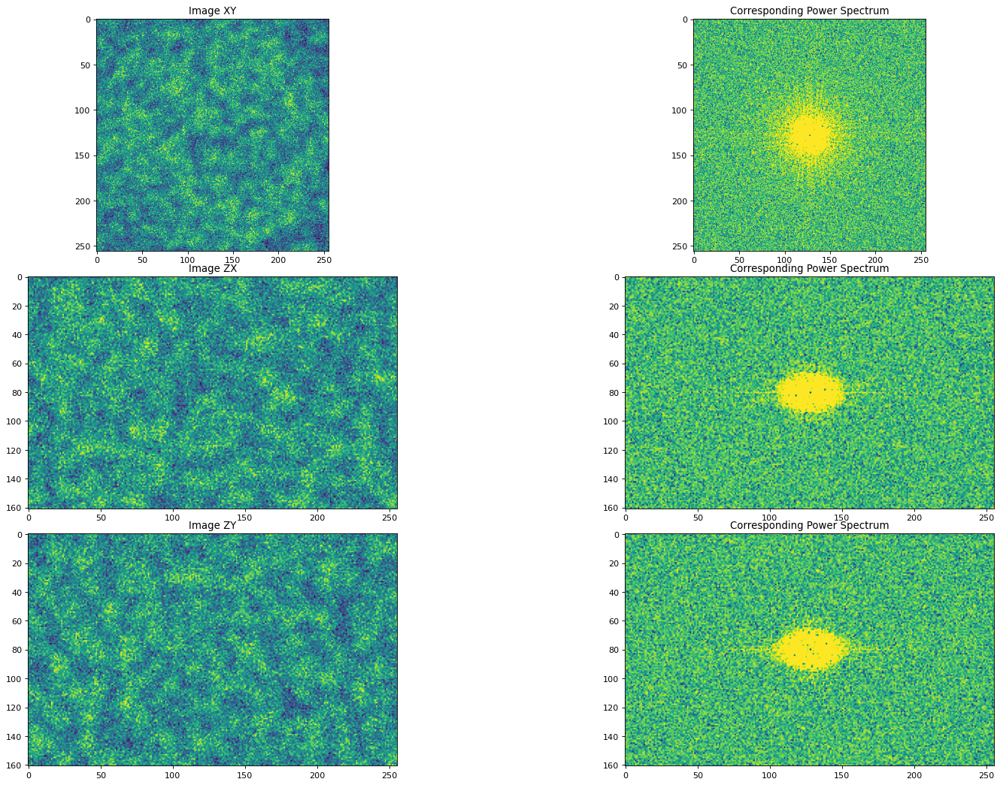

In [277]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [1, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_data[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_Fdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_data[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_Fdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_data[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_Fdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

(array([3097484., 2784274., 1930718., 1202121.,  699560.,  388547.,
         207512.,  107148.,   54394.,   79538.]),
 array([0.02374206, 0.67943578, 1.3351295 , 1.99082322, 2.64651693,
        3.30221065, 3.95790437, 4.61359809, 5.26929181, 5.92498553,
        6.58067925]),
 <BarContainer object of 10 artists>)

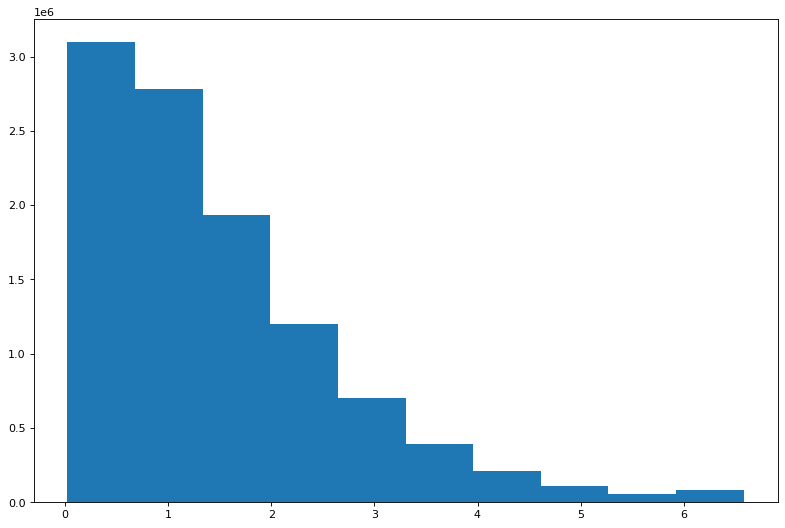

In [278]:
power_Fdata = np.exp(logPower_Fdata)
# power_Fdata = standardize(clip(power_Fdata))
plt.hist(power_Fdata.flatten())

# Fourier transform of a Bernoulli mask

In [29]:
# fft_data = my_dataset.dataF.numpy()
# mask = my_dataset.create_bernoulliMask()[0]
mask = bernoulli_tensor
fft_data = np.fft.irfftn(mask)
# fft_data = fft_data[:, :, 0:233]
logPower_Fdata = np.log(np.abs(fft_data)**2)
logPower_Fdata = standardize(clip(logPower_Fdata))

(array([ 193238.,  162428.,  300636.,  548988., 1014004., 1843958.,
        3251398., 5163271., 5888004., 2654235.]),
 array([-4.09447564, -3.53145339, -2.96843113, -2.40540887, -1.84238661,
        -1.27936435, -0.71634209, -0.15331984,  0.40970242,  0.97272468,
         1.53574694]),
 <BarContainer object of 10 artists>)

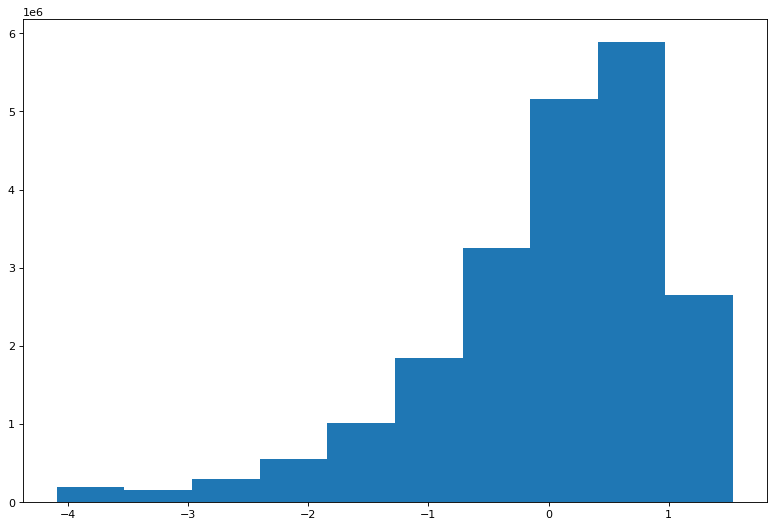

In [30]:
plt.hist(logPower_Fdata.flatten())

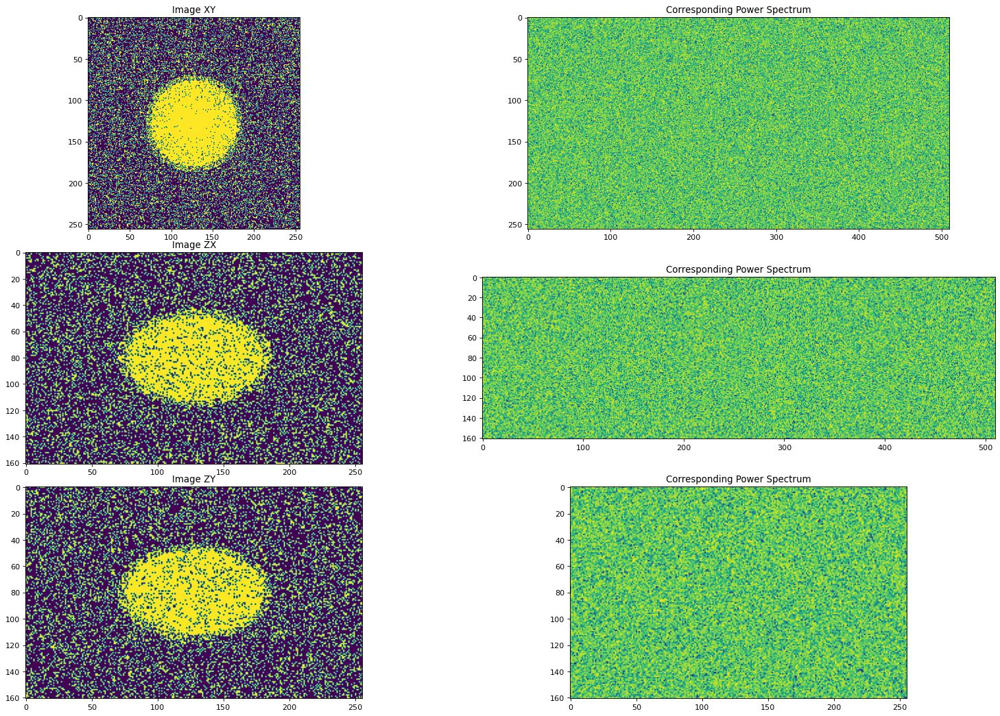

In [31]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [1, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(mask[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_Fdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(mask[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_Fdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(mask[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_Fdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

(array([3982794., 4057270., 3703665., 3088483., 2350277., 1636302.,
        1038204.,  596160.,  313094.,  253911.]),
 array([0.01666448, 0.47947739, 0.94229031, 1.40510322, 1.86791613,
        2.33072905, 2.79354196, 3.25635487, 3.71916778, 4.1819807 ,
        4.64479361]),
 <BarContainer object of 10 artists>)

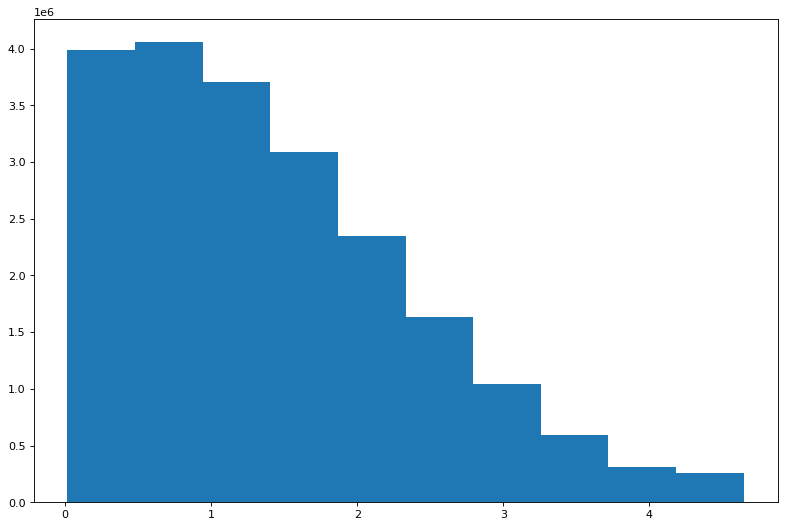

In [32]:
power_Fdata = np.exp(logPower_Fdata)
# power_Fdata = standardize(clip(power_Fdata))
plt.hist(power_Fdata.flatten())

# High power mask

In [25]:
# highP_mask = my_dataset.create_bernoulliMask()[0].numpy()*(power_Fdata>np.quantile(power_Fdata, 0.5)).astype(int)
highP_mask = (power_Fdata>np.quantile(power_Fdata, 0.5)).astype(int)

logPower_filtered = highP_mask*logPower_Fdata

fft_filtered = highP_mask*fft_data
tomo_filtered = np.fft.irfftn(fft_filtered)
# tomo_filtered = np.real(tomo_filtered)

(array([ 441631., 1034472., 2721388., 4138180., 2970947., 2400922.,
        3631055., 3916564., 2619265., 1207560.]),
 array([-2.3588214 , -1.924957  , -1.4910928 , -1.0572284 , -0.6233641 ,
        -0.1894998 ,  0.24436453,  0.67822886,  1.1120932 ,  1.5459574 ,
         1.9798218 ], dtype=float32),
 <BarContainer object of 10 artists>)

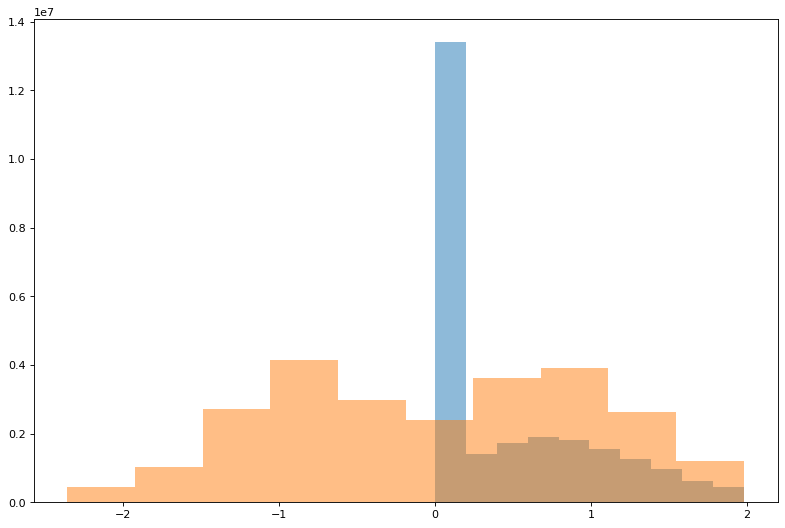

In [26]:
plt.hist(logPower_filtered.flatten(), alpha=0.5)
plt.hist(logPower_Fdata.flatten(), alpha=0.5)

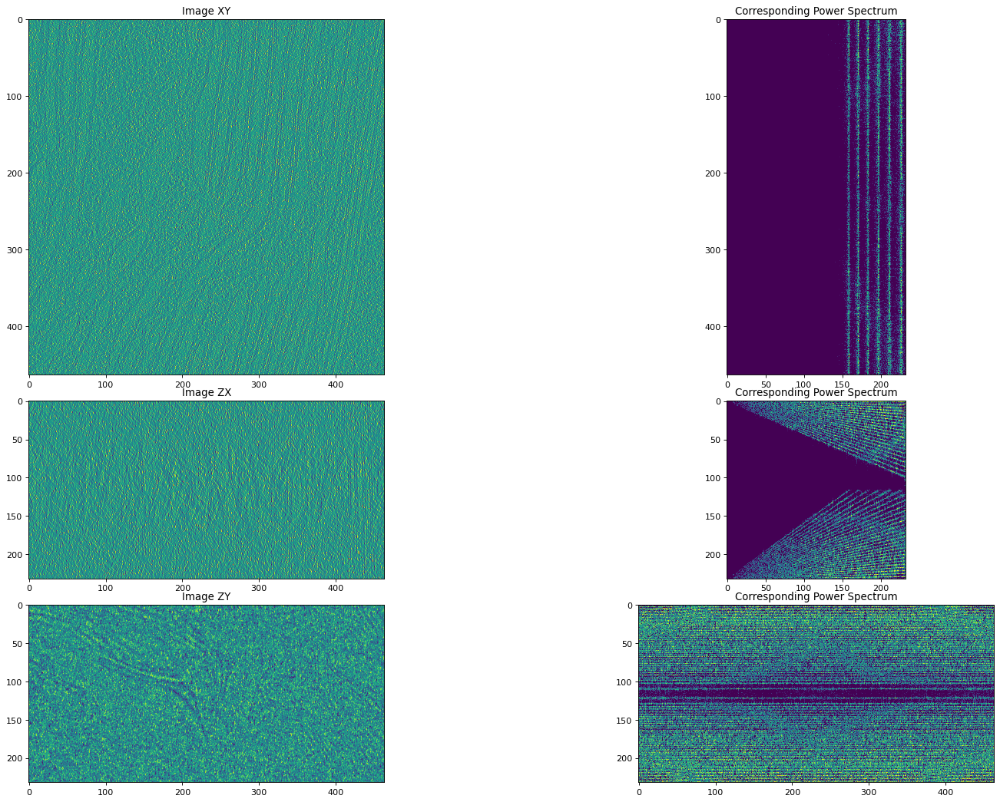

In [27]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_filtered[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_filtered[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_filtered[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

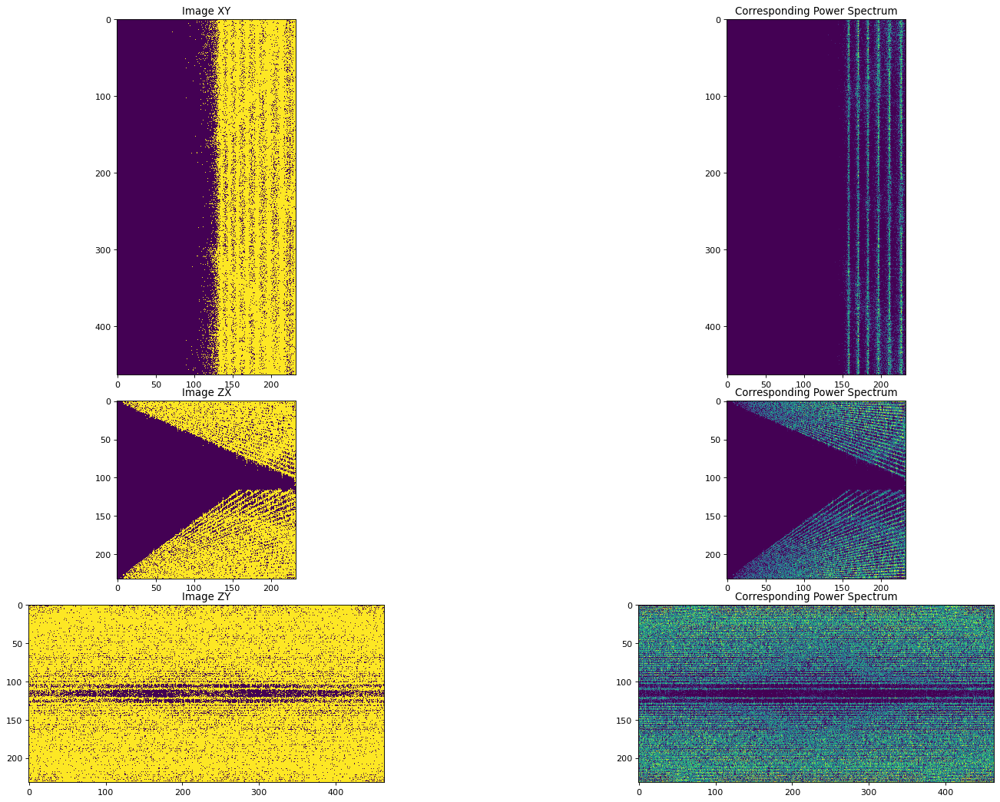

In [33]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(highP_mask[tomo_shape[0]//4])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(highP_mask[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(highP_mask[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

# Weighted Bernoulli mask

In [404]:
# ############### Gaussian ##################

# z, y, x = np.mgrid[0:tomo_shape[0]:1, 0:tomo_shape[1]:1, 0:tomo_shape[2]:1]

# zyx = np.column_stack([z.flat, y.flat, x.flat])
# zyx.shape

# mu = tomo_shape//2
# sigma = tomo_shape//4
# covariance = np.diag(sigma**2)

# rv = multivariate_normal(mu, covariance)
# pdf = rv.pdf(zyx)
# pdf = pdf.reshape(tomo_shape)

# draw_probs = 0.5*pdf/pdf.max()
# highP_mask = 0.3*(power_Fdata>np.quantile(power_Fdata, 0.5)).astype(int)

# bernoulli_tensor = torch.bernoulli(torch.tensor(draw_probs+highP_mask+0.05)).numpy()

# bernoulli_tensor.sum()/tomo_shape.prod()

In [11]:
tomo_shape, my_dataset.tomoF_shape

(array([161, 256, 256]), torch.Size([161, 256, 129]))

In [115]:
############### Quantile ##################

z, y, x = np.mgrid[0:tomo_shape[0]:1, 0:tomo_shape[1]:1, 0:tomo_shape[2]:1]

zyx = np.column_stack([z.flat, y.flat, x.flat])
zyx.shape

mu = tomo_shape//2
# I want to be able to fit 4*sigma within the image
sigma = tomo_shape//4
covariance = np.diag(sigma**2)

rv = multivariate_normal(mean=mu, cov=covariance)
pdf = rv.pdf(zyx)
pdf = pdf.reshape(tomo_shape)

# we want to have a downward stepwise probability of sampling,
# at the center we sample with higher probability than at the extremes.
# lets do it like this:
# best 20% of values with p = 0.8
# best 48% outside the first 20% (1 sigma) with p=0.6
M = 1.1
m = 0.1
r1 = np.random.uniform(m, M)

v1 = rv.pdf(mu+1.1*sigma)
q1 = pdf<v1
print(q1.sum()/tomo_shape.prod())

draw_probs = q1
_bt = torch.tensor(draw_probs).float()
bernoulli_tensor = torch.bernoulli(_bt).numpy()

bernoulli_tensor.sum()/tomo_shape.prod()

0.5501363055306192


0.5501363055306192

In [116]:
rv.pdf(mu+sigma)

8.647061251472962e-08

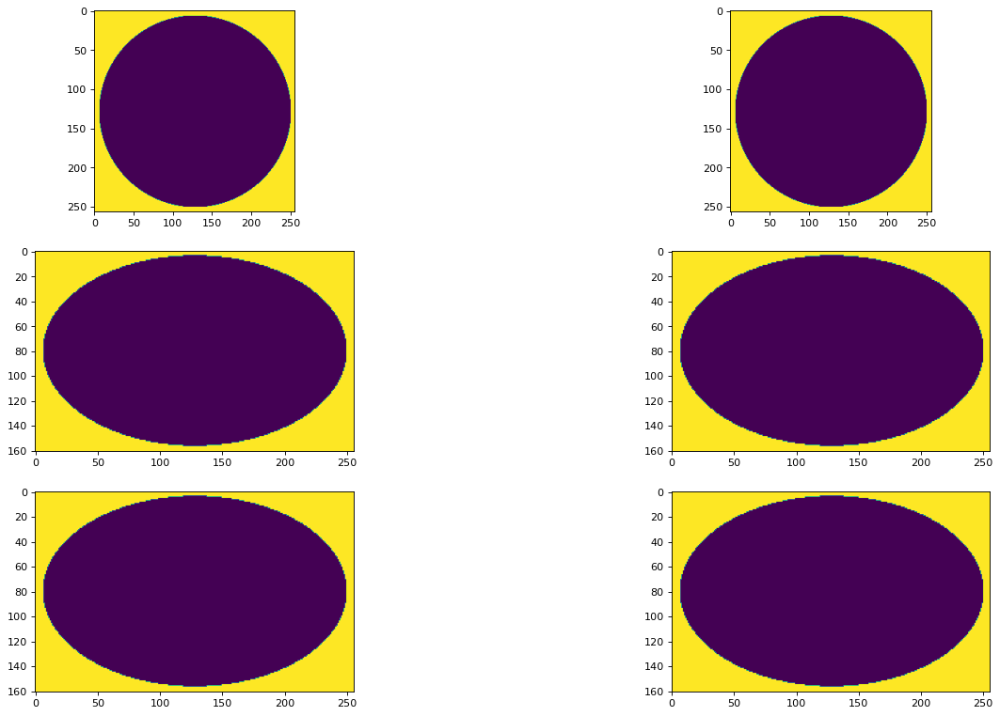

In [117]:
fig, (ax0, ax1, ax2) = plt.subplots(3, 2, figsize=(20, 12))
ax0[0].imshow(draw_probs[tomo_shape[0]//2])
ax0[1].imshow(bernoulli_tensor[tomo_shape[0]//2])

ax1[0].imshow(draw_probs[:, tomo_shape[1]//2, :])
ax1[1].imshow(bernoulli_tensor[:, tomo_shape[1]//2, :])

ax2[0].imshow(draw_probs[:, :, tomo_shape[2]//2])
ax2[1].imshow(bernoulli_tensor[:, :, tomo_shape[2]//2])

In [170]:
logPower_filtered = bernoulli_tensor*logPower_Fdata

fft_filtered = bernoulli_tensor*fft_data
tomo_filtered = np.fft.ifftn(np.fft.ifftshift(fft_filtered))
tomo_filtered = np.real(tomo_filtered)

(array([ 105679.,  104606.,  208524.,  406734.,  767084., 1362380.,
        2141478., 2651595., 2065250.,  737966.]),
 array([-3.7532449 , -3.19923444, -2.64522399, -2.09121353, -1.53720307,
        -0.98319261, -0.42918216,  0.1248283 ,  0.67883876,  1.23284921,
         1.78685967]),
 <BarContainer object of 10 artists>)

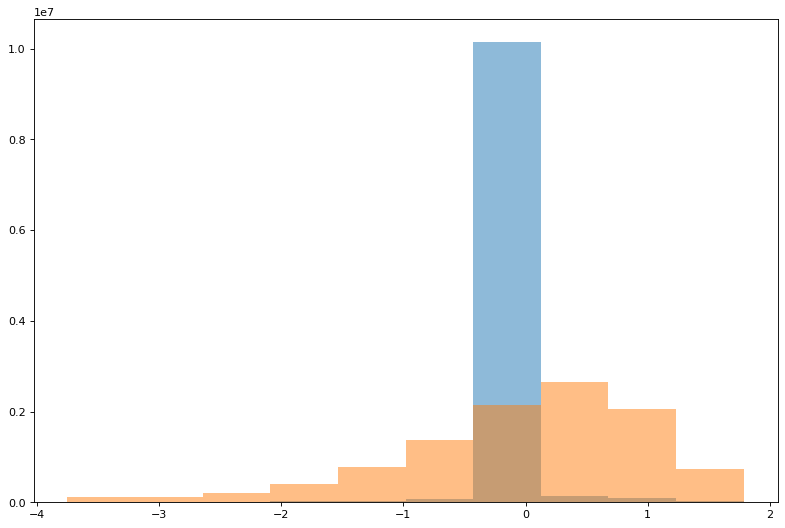

In [171]:
plt.hist(logPower_filtered.flatten(), alpha=0.5)
plt.hist(logPower_Fdata.flatten(), alpha=0.5)

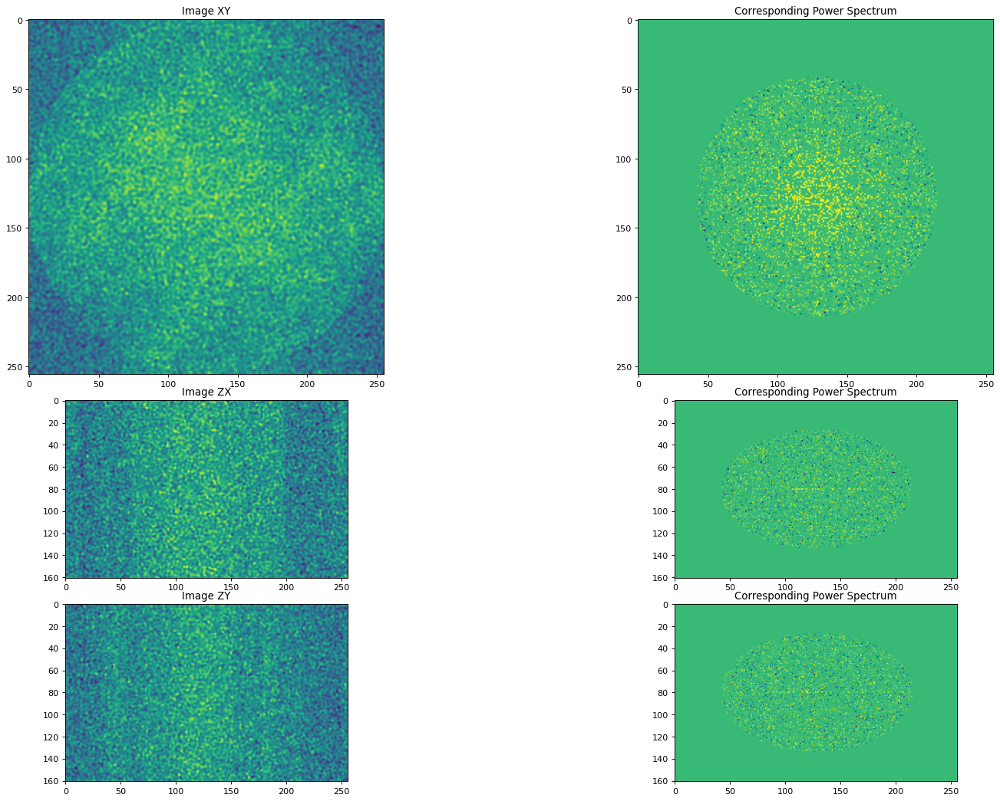

In [172]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_filtered[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_filtered[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_filtered[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

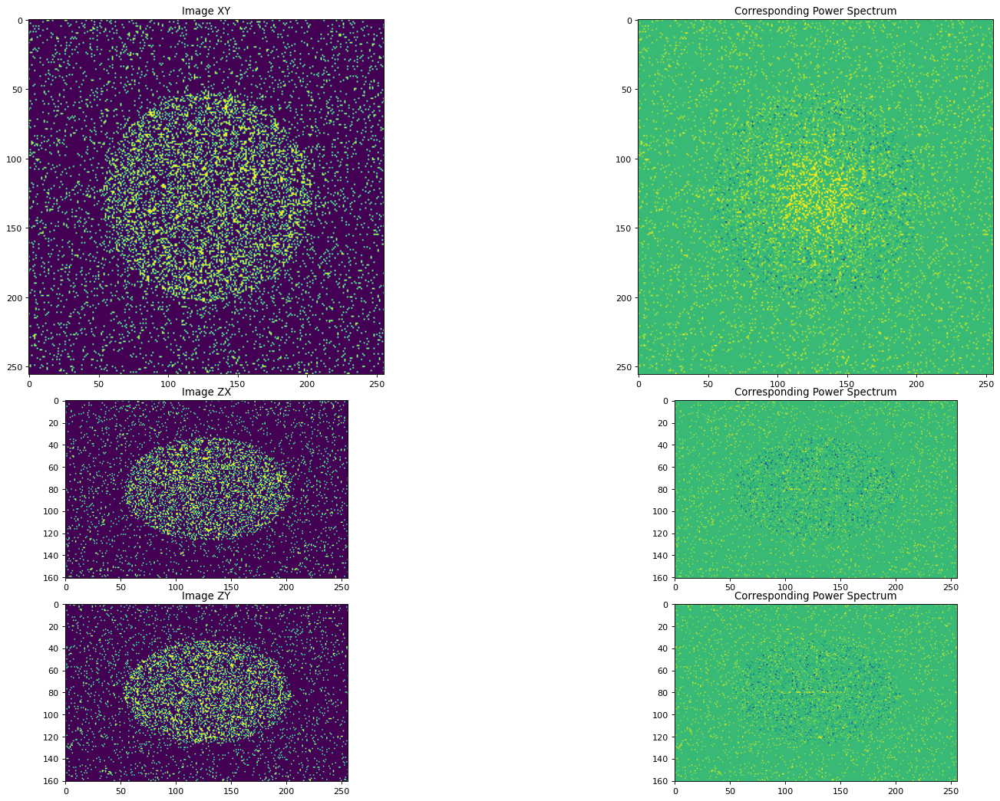

In [165]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(bernoulli_tensor[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(bernoulli_tensor[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(bernoulli_tensor[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')

plt.show()

# Frequency masks

In [285]:
def make_shell(inner_radius, outer_radius, tomo_shape):
    """
    Creates a (3D) shell with given inner_radius and delta_r width centered at the middle of the array.
    
    """

    length = min(tomo_shape)
    if length%2==1:
        length = length-1
        
    mask_shape = len(tomo_shape) * [length]
    print(mask_shape)
    _shell_mask = np.zeros(mask_shape)

    # only do positive quadrant first
    for z in range(0, outer_radius + 1):
        for y in range(0, outer_radius + 1):
            for x in range(0, outer_radius + 1):
                
                r = np.linalg.norm([z, y, x])

                if r >= inner_radius and r < outer_radius:
                    zidx = z + length // 2
                    yidx = y + length // 2
                    xidx = x + length // 2

                    _shell_mask[zidx, yidx, xidx] = 1
    
    aux = (
        np.rot90(_shell_mask, axes=(0, 1))
        + np.rot90(_shell_mask, 2, axes=(0, 1))
        + np.rot90(_shell_mask, 3, axes=(0, 1))
    )

    _shell_mask = _shell_mask + aux # this is half the volume

    aux = np.rot90(_shell_mask, 2, axes=(1, 2)) # rotate again 180º to get full volume

    aux2 = _shell_mask + aux
    
    if inner_radius == 0:
        vol = 4/3 * np.pi * outer_radius**3
        pct_diff = (vol - aux2.sum())/vol
        if pct_diff>0.1:
            print(pct_diff)
            raise ValueError("Sanity check for sphere volume not passed")
    

    # finally, fill the actual shape of the tomogram with the mask
    shell_mask = np.zeros(tomo_shape)
    shell_mask[
        (tomo_shape[0] - length) // 2 : (tomo_shape[0] + length) // 2,
        (tomo_shape[1] - length) // 2 : (tomo_shape[1] + length) // 2,
        (tomo_shape[2] - length) // 2 : (tomo_shape[2] + length) // 2
    ] = aux2

    return shell_mask

In [286]:
inner = 0
outer = 10
my_shape = np.array([120, 180, 150])
shell_mask = make_shell(inner, outer, tomo_shape)
shell_mask.shape

[160, 160, 160]


(161, 256, 256)

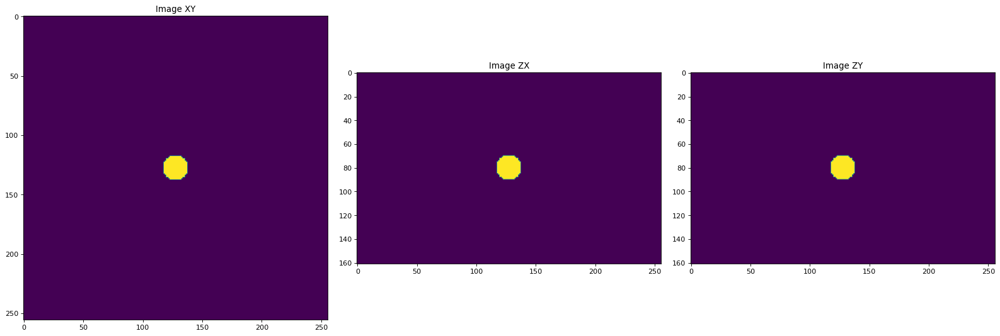

In [287]:
fig, ax = plt.subplots(1, 3, figsize=(20, 13))  
plt.tight_layout()

ax[0].imshow(shell_mask[shell_mask.shape[0]//2])
ax[0].set_title('Image XY')

ax[1].imshow(shell_mask[:, shell_mask.shape[1]//2, :])
ax[1].set_title('Image ZX')

ax[2].imshow(shell_mask[:, :, shell_mask.shape[2]//2])
ax[2].set_title('Image ZY')


plt.show()

In [288]:
fft_loFreq = shell_mask*fft_data
tomo_loFreqFilt = np.fft.ifftn(np.fft.ifftshift(fft_loFreq))
tomo_loFreqFilt = np.real(tomo_loFreqFilt)

logPower_loFreqFdata = np.log(np.abs(fft_loFreq)**2)
# logPower_loFreqFdata = standardize(clip(logPower_loFreqFdata))

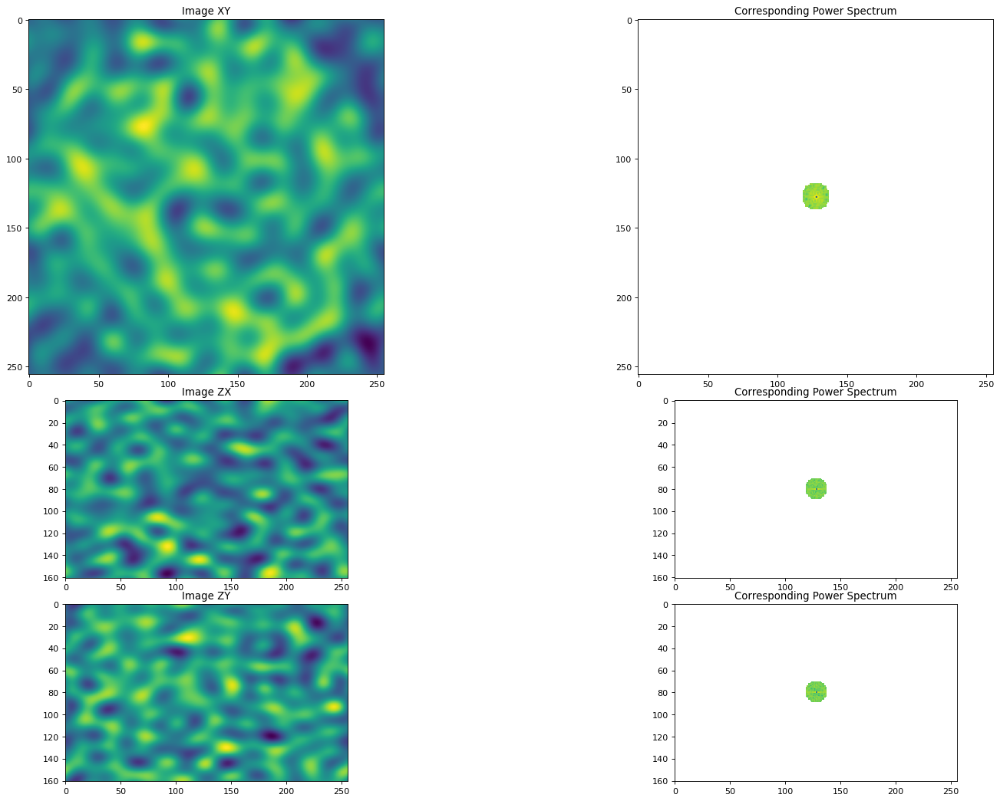

In [289]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_loFreqFilt[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_loFreqFdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_loFreqFilt[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_loFreqFdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_loFreqFilt[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_loFreqFdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

## Downward stepwise

In [279]:
# we want to have a downward stepwise probability of sampling,
# at the center we sample with higher probability than at the extremes.
# lets do it like this:
# best 20% of values with p = 0.8
# best 48% outside the first 20% (1 sigma) with p=0.6
M = 1.1
m = 0.1
r1 = np.random.uniform(m, M)

inner = 0
outer = np.random.randint(int(0.1*min(tomo_shape)//2), int(0.8*min(tomo_shape)//2))
# outer = min(tomo_shape//20)
q1 = 1*make_shell(inner, outer, tomo_shape)
q1 = np.where(q1==0, 0.1, q1)

# inner = outer
# outer = min(tomo_shape//10)
# q2 = 0.8*make_shell(inner, outer, tomo_shape)

# inner = outer
# outer = min(tomo_shape//5)
# q3 = 0.5*make_shell(inner, outer, tomo_shape)

draw_probs = q1#+q2+q3

print(draw_probs.sum()/tomo_shape.prod())

_bt = torch.tensor(draw_probs).float()
bernoulli_tensor = torch.bernoulli(_bt).numpy()

bernoulli_tensor.sum()/tomo_shape.prod()

[160, 160, 160]
0.1241398971273271


0.12409641431725543

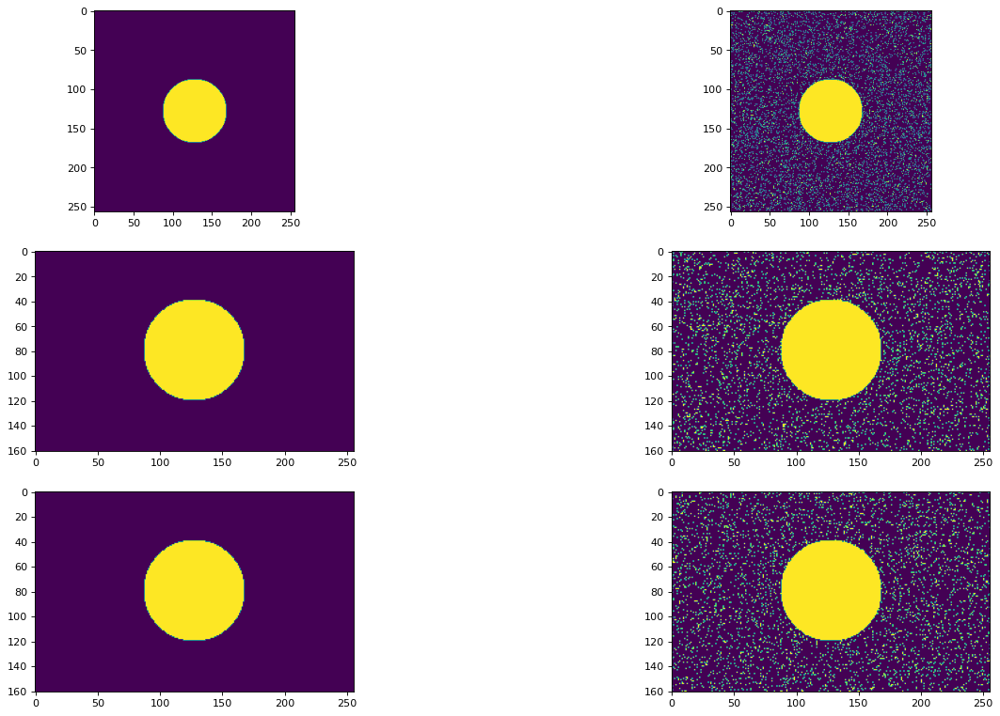

In [280]:
fig, (ax0, ax1, ax2) = plt.subplots(3, 2, figsize=(20, 12))
ax0[0].imshow(draw_probs[tomo_shape[0]//2])
ax0[1].imshow(bernoulli_tensor[tomo_shape[0]//2])

ax1[0].imshow(draw_probs[:, tomo_shape[1]//2, :])
ax1[1].imshow(bernoulli_tensor[:, tomo_shape[1]//2, :])

ax2[0].imshow(draw_probs[:, :, tomo_shape[2]//2])
ax2[1].imshow(bernoulli_tensor[:, :, tomo_shape[2]//2])

In [281]:
logPower_filtered = bernoulli_tensor*logPower_Fdata

fft_filtered = bernoulli_tensor*fft_data
tomo_filtered = np.fft.ifftn(np.fft.ifftshift(fft_filtered))
tomo_filtered = np.real(tomo_filtered)

(array([ 106937.,  109008.,  220004.,  434097.,  824852., 1470780.,
        2278698., 2689950., 1869953.,  547017.]),
 array([-3.74050717, -3.17804265, -2.61557814, -2.05311363, -1.49064911,
        -0.9281846 , -0.36572008,  0.19674443,  0.75920894,  1.32167346,
         1.88413797]),
 <BarContainer object of 10 artists>)

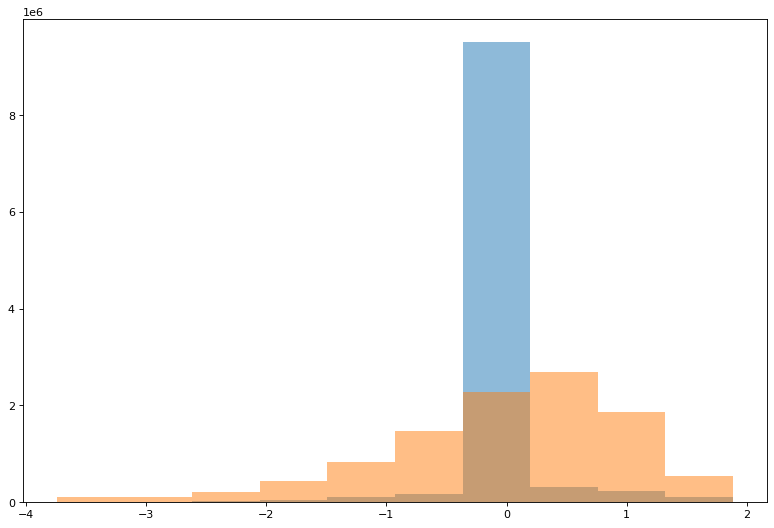

In [282]:
plt.hist(logPower_filtered.flatten(), alpha=0.5)
plt.hist(logPower_Fdata.flatten(), alpha=0.5)

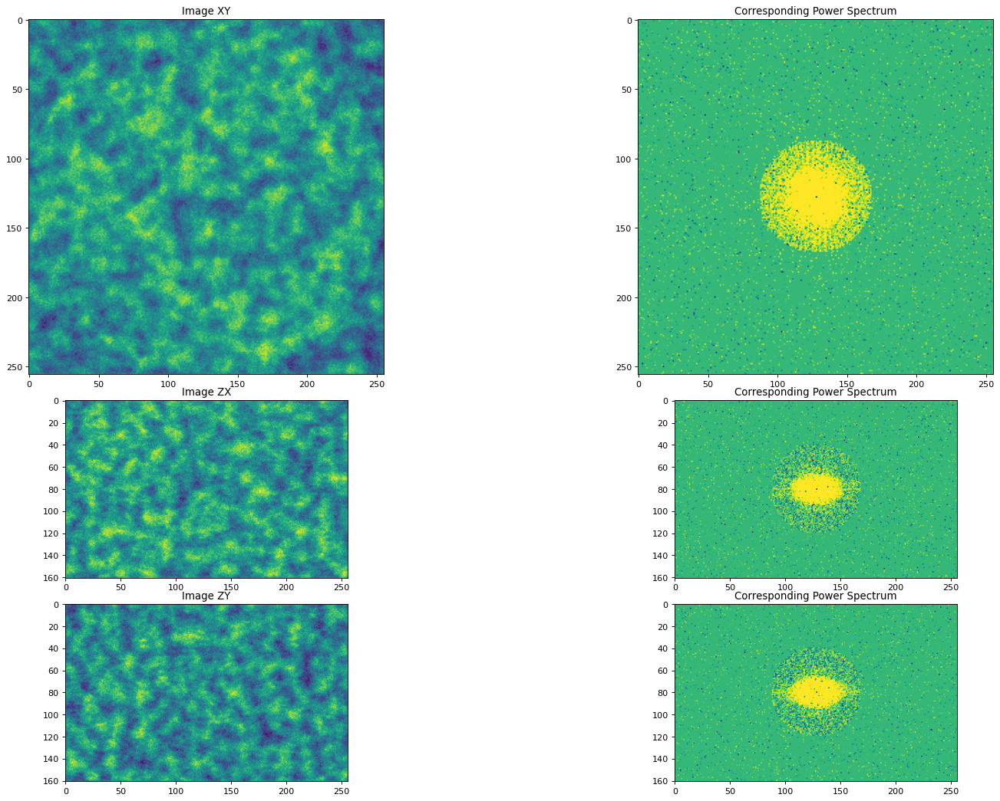

In [283]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_filtered[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_filtered[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_filtered[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

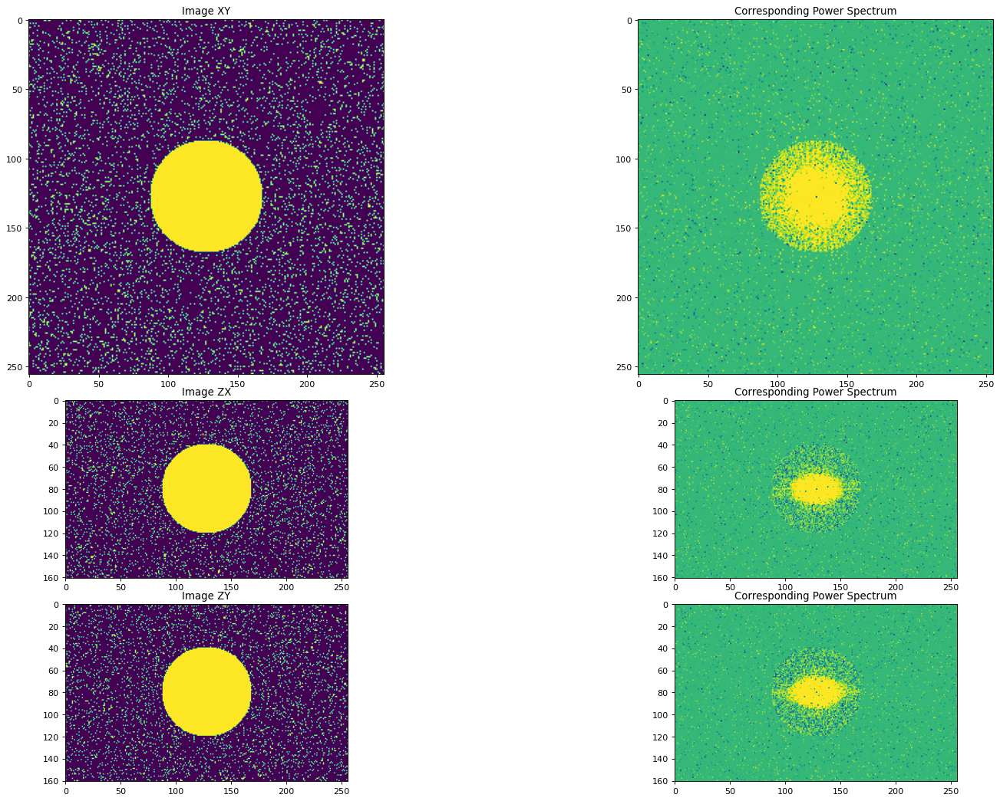

In [284]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(bernoulli_tensor[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(bernoulli_tensor[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(bernoulli_tensor[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')

plt.show()

# Combine masks

In [15]:
fft_loFreq = highP_mask*shell_mask*fft_data
tomo_loFreqFilt = np.fft.ifftn(np.fft.ifftshift(fft_loFreq))
tomo_loFreqFilt = np.real(tomo_loFreqFilt)

logPower_loFreqFdata = np.log(np.abs(fft_loFreq)**2)
# logPower_loFreqFdata = standardize(clip(logPower_loFreqFdata))

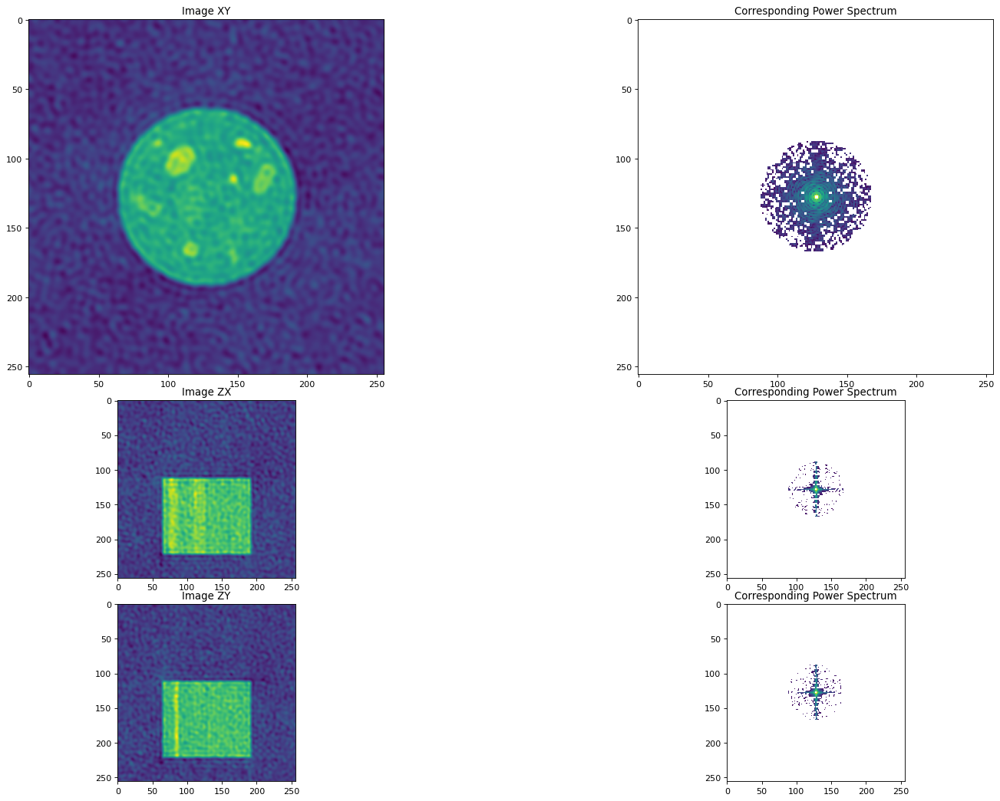

In [16]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_loFreqFilt[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_loFreqFdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_loFreqFilt[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_loFreqFdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_loFreqFilt[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_loFreqFdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()